# Initialization

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import os
import json
from distfit import distfit
from scipy import stats
import pickle
from SkillingsMack import cMackSkil
from collections import Counter
import random
from rliable import library as rly


# import itertools
# import math
# import seaborn as sns
# import scikit_posthocs

In [2]:
# Here I load my data
with open(r'atari_100k\OTRainbow.json') as ff:
    a100 = json.load(ff)
rain_ret = a100

der_ret = dict()
for root, dirs, files in os.walk(r"atari_100k\DER"):
    for file in files:
        if file.endswith(".json"):
            with open(os.path.join(root, file)) as ff:
                a100 = json.load(ff)
                der_ret.update({file[:-5]: [i['eval_average_return'] for i in a100]})

curl_ret = dict()
for root, dirs, files in os.walk(r"atari_100k\CURL"):
    for file in files:
        if file.endswith(".json"):
            with open(os.path.join(root, file)) as ff:
                a100 = json.load(ff)
                curl_ret.update({file[:-5]: [i['eval_average_return'] for i in a100]})

with open(r'atari_100k\SPR.json') as ff:
    a100 = json.load(ff)
spr_ret = a100

with open(r'atari_100k\DrQ.json') as ff:
    a100 = json.load(ff)
drq_ret = a100

with open(r'atari_100k\DrQ(eps).json') as ff:
    a100 = json.load(ff)
drqeps_ret = a100

algo_bench = {'CURL': curl_ret, 'DER': der_ret, 'DrQ': drq_ret, 'DrQ(eps)': drqeps_ret, 'OTR': rain_ret, 'SPR': spr_ret}
games = list(rain_ret.keys())

In [3]:

#@title Record scores on Atari games
record_scores = False

ALL_HUMAN_RECORD = {
  'Alien': 251916.0,
  'Amidar': 104159.0,
  'Assault': 8647.0,
  'Asterix': 1000000.0,
  'Asteroids': 10506650.0,
  'Atlantis': 10604840.0,
  'BankHeist': 82058.0,
  'BattleZone': 801000.0,
  'BeamRider': 999999.0,
  'Berzerk': 1057940.0,
  'Bowling': 300.0,
  'Boxing': 100.0,
  'Breakout': 864.0,
  'Centipede': 1301709.0,
  'ChopperCommand': 999999.0,
  'CrazyClimber': 219900.0,
  'DemonAttack': 1556345.0,
  'DoubleDunk': 22.0,
  'Enduro': 9500.0,
  'FishingDerby': 71.0,
  'Freeway': 38.0,
  'Frostbite': 454830.0,
  'Gopher': 355040.0,
  'Gravitar': 162850.0,
  'Hero': 1000000.0,
  'IceHockey': 36.0,
  'Jamesbond': 45550.0,
  'Kangaroo': 1424600.0,
  'Krull': 104100.0,
  'KungFuMaster': 1000000.0,
  'MontezumaRevenge': 1219200.0,
  'MsPacman': 290090.0,
  'NameThisGame': 25220.0,
  'Phoenix': 4014440.0,
  'Pitfall': 114000.0,
  'Pong': 21.0,
  'PrivateEye': 101800.0,
  'Qbert': 2400000.0,
  'Riverraid': 1000000.0,
  'RoadRunner': 2038100.0,
  'Robotank': 76.0,
  'Seaquest': 999999.0,
  'Skiing': -3272.0,
  'Solaris': 111420.0,
  'SpaceInvaders': 621535.0,
  'StarGunner': 77400.0,
  'Tennis': 21.0,
  'TimePilot': 65300.0,
  'Tutankham': 5384.0,
  'UpNDown': 82840.0,
  'Venture': 38900.0,
  'VideoPinball': 89218328.0,
  'WizardOfWor': 395300.0,
  'YarsRevenge': 15000105.0,
  'Zaxxon': 83700.0,
  'AirRaid': 23050.0,
  'Carnival': 2541440.0,
  'ElevatorAction': 156550.0,
  'JourneyEscape': -4317804.0,
  'Pooyan': 13025.0
}
RANDOM_SCORES = {
 'Alien': 227.8,
 'Amidar': 5.8,
 'Assault': 222.4,
 'Asterix': 210.0,
 'BankHeist': 14.2,
 'BattleZone': 2360.0,
 'Boxing': 0.1,
 'Breakout': 1.7,
 'ChopperCommand': 811.0,
 'CrazyClimber': 10780.5,
 'DemonAttack': 152.1,
 'Freeway': 0.0,
 'Frostbite': 65.2,
 'Gopher': 257.6,
 'Hero': 1027.0,
 'Jamesbond': 29.0,
 'Kangaroo': 52.0,
 'Krull': 1598.0,
 'KungFuMaster': 258.5,
 'MsPacman': 307.3,
 'Pong': -20.7,
 'PrivateEye': 24.9,
 'Qbert': 163.9,
 'RoadRunner': 11.5,
 'Seaquest': 68.4,
 'UpNDown': 533.4
}

HUMAN_SCORES = {
 'Alien': 7127.7,
 'Amidar': 1719.5,
 'Assault': 742.0,
 'Asterix': 8503.3,
 'BankHeist': 753.1,
 'BattleZone': 37187.5,
 'Boxing': 12.1,
 'Breakout': 30.5,
 'ChopperCommand': 7387.8,
 'CrazyClimber': 35829.4,
 'DemonAttack': 1971.0,
 'Freeway': 29.6,
 'Frostbite': 4334.7,
 'Gopher': 2412.5,
 'Hero': 30826.4,
 'Jamesbond': 302.8,
 'Kangaroo': 3035.0,
 'Krull': 2665.5,
 'KungFuMaster': 22736.3,
 'MsPacman': 6951.6,
 'Pong': 14.6,
 'PrivateEye': 69571.3,
 'Qbert': 13455.0,
 'RoadRunner': 7845.0,
 'Seaquest': 42054.7,
 'UpNDown': 11693.2
}

NORM_BASELINE = ALL_HUMAN_RECORD if record_scores else HUMAN_SCORES 

def score_normalization(scores, min_scores, max_scores):
  # min should be random scores, max should be human scores.
  norm_scores = np.divide(np.subtract(scores, min_scores), max_scores - min_scores)
  return norm_scores

# Data and distribution obtained by merging across algorithms scores

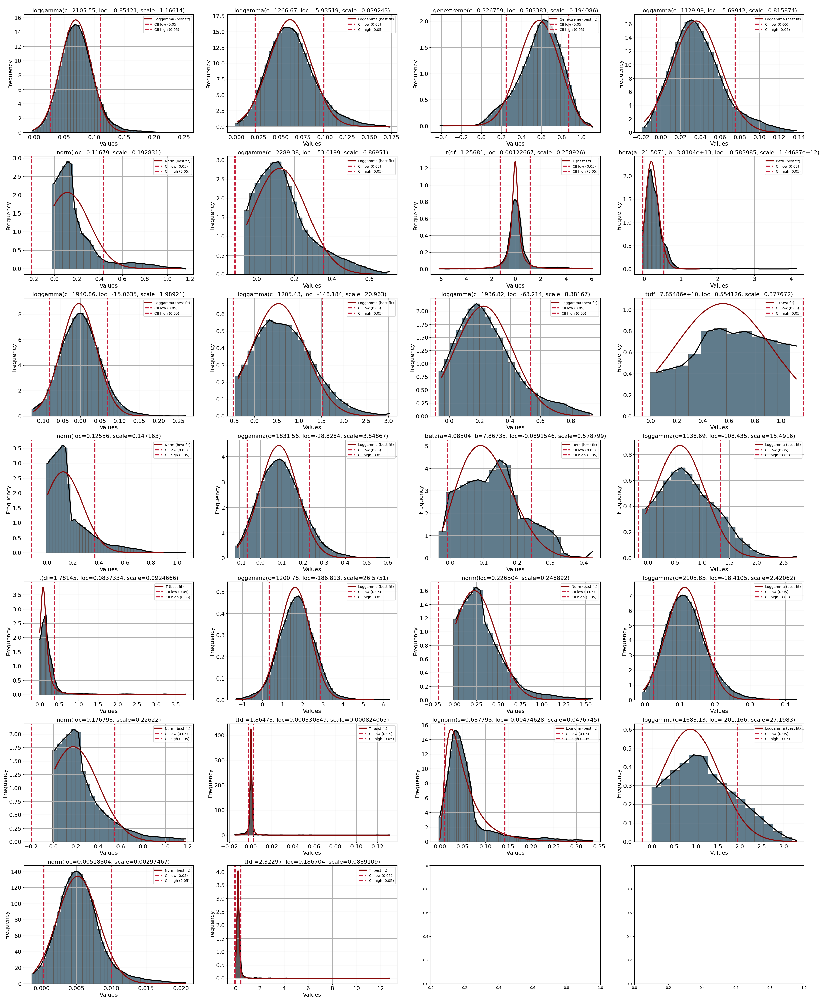

In [19]:
results_merged = list()
fig, ax = plt.subplots(7, 4, figsize=(40,50))
ax_idx = 0
for game in games:
    data = np.array([i for key in algo_bench.keys() for i in algo_bench[key][game]], dtype=float) # Mixes all data from all algorithms
    norm_data = score_normalization(data, RANDOM_SCORES[game], NORM_BASELINE[game])
    _, p_val = stats.normaltest(norm_data)
    if p_val > 0.05:
        dfit = distfit(distr='norm', alpha=0.05, smooth=10, verbose=0)
    else:
        # Search for best theoretical fit on your empirical data
        dfit = distfit(distr="popular", alpha=0.05, smooth= 10, verbose=0)
    # Search for best theoretical fit on your empirical data
    results_merged.append(dfit.fit_transform(norm_data))
    i, j = divmod(ax_idx, 4)
    ax_idx +=1
    dfit.plot(ax=ax[i, j])

[distfit] >INFO> fit
[distfit] >INFO> transform
[distfit] >INFO> [norm      ] [0.00 sec] [RSS: 236.939] [loc=0.075 scale=0.024]
[distfit] >INFO> [expon     ] [0.00 sec] [RSS: 921.723] [loc=0.028 scale=0.047]
[distfit] >INFO> [pareto    ] [0.02 sec] [RSS: 921.723] [loc=-4194303.972 scale=4194304.000]
[distfit] >INFO> [dweibull  ] [0.02 sec] [RSS: 102.297] [loc=0.071 scale=0.018]
[distfit] >INFO> [t         ] [0.11 sec] [RSS: 72.0591] [loc=0.070 scale=0.015]
[distfit] >INFO> [genextreme] [0.17 sec] [RSS: 64.8395] [loc=0.064 scale=0.018]
[distfit] >INFO> [gamma     ] [0.08 sec] [RSS: 1259.76] [loc=0.028 scale=0.963]
[distfit] >INFO> [lognorm   ] [0.06 sec] [RSS: 77.6617] [loc=0.003 scale=0.068]
[distfit] >INFO> [beta      ] [0.10 sec] [RSS: 102.121] [loc=0.018 scale=52159.302]
[distfit] >INFO> [uniform   ] [0.00 sec] [RSS: 930.336] [loc=0.028 scale=0.147]
[distfit] >INFO> [loggamma  ] [0.11 sec] [RSS: 248.268] [loc=-10.975 scale=1.377]
[distfit] >INFO> fit
[distfit] >INFO> transform
[dist

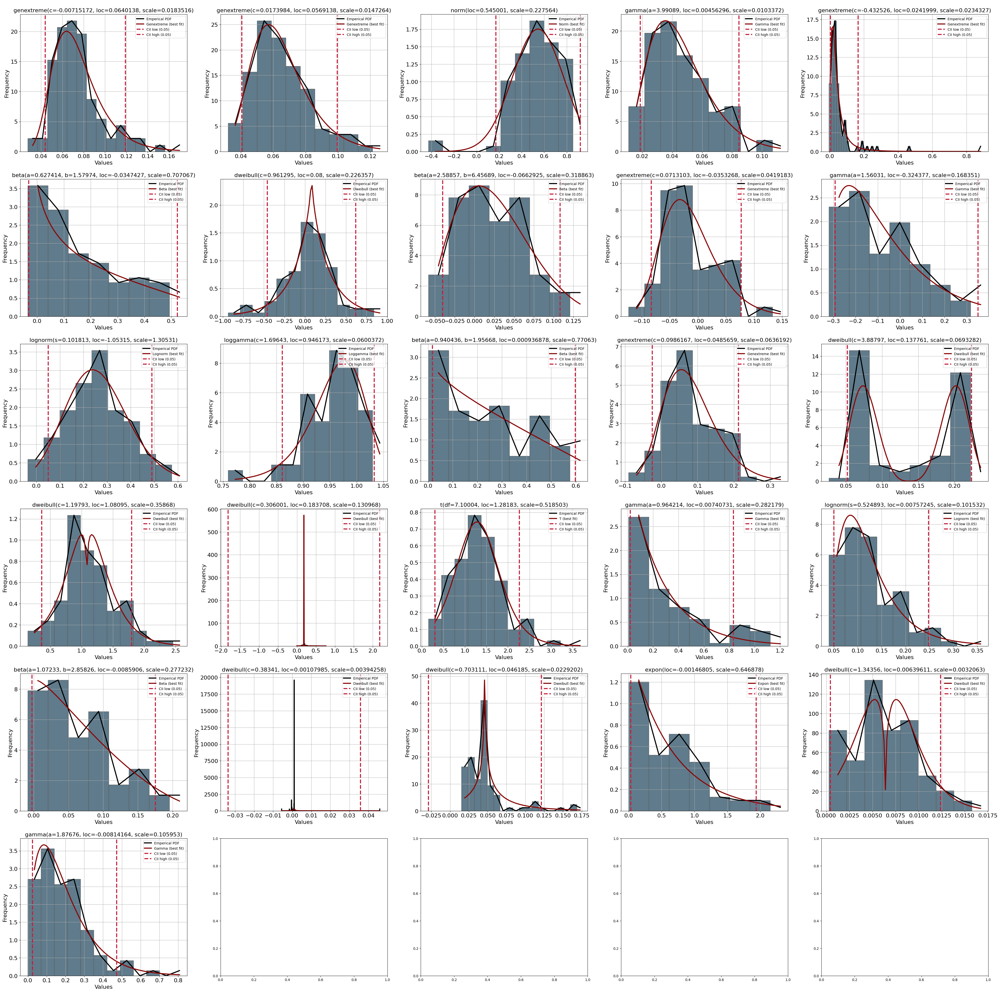

In [5]:
results = list()
fig, ax = plt.subplots(6, 5, figsize=(50,50))
ax_idx = 0
for game in games:
    data = np.array([i for i in algo_bench['CURL'][game]], dtype=float)
    norm_data = score_normalization(data, RANDOM_SCORES[game], NORM_BASELINE[game])
    # Search for best theoretical fit on your empirical data
    dfit = distfit(todf=True, distr="popular", alpha=0.05)
    results.append(dfit.fit_transform(norm_data))
    i, j = divmod(ax_idx, 5)
    ax_idx +=1
    dfit.plot(ax=ax[i, j])

In [6]:
results[0]['model']['model'].rvs(size=10)

array([0.06973286, 0.08431461, 0.11214117, 0.05496928, 0.05919351,
       0.09086908, 0.09021157, 0.06973774, 0.0644291 , 0.09567866])

# Data and distribution of games and algorithms (no merging)

In [ ]:
results = list()
fig, ax = plt.subplots(26, 6, figsize=(50,8*26))
ax_idx = 0

for game in games:
    print(f"Summary of game {game} ---------------")
    for key in algo_bench.keys():

        data = np.array([i for i in algo_bench[key][game]], dtype=float)
        norm_data = score_normalization(data, RANDOM_SCORES[game], NORM_BASELINE[game])
        # Search for best theoretical fit on your empirical data
        dfit = distfit(todf=True, distr="popular", alpha=0.05, smooth=10, verbose=0)
        results.append(dfit.fit_transform(norm_data))
        i, j = divmod(ax_idx, 6)
        ax_idx +=1
        dfit.plot(ax=ax[i, j])
        print(dfit.summary)

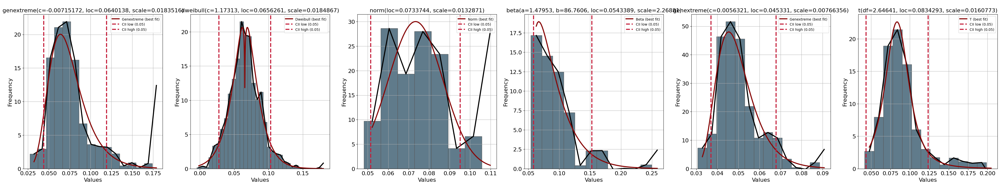

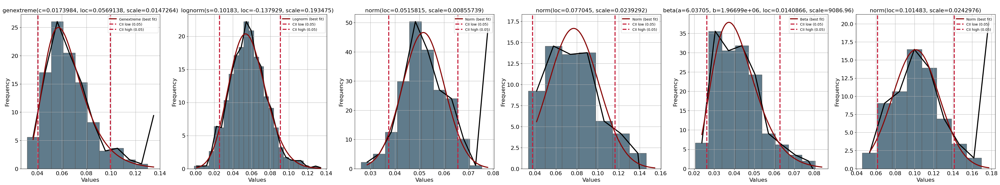

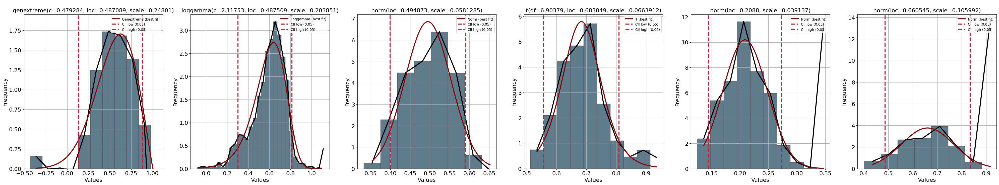

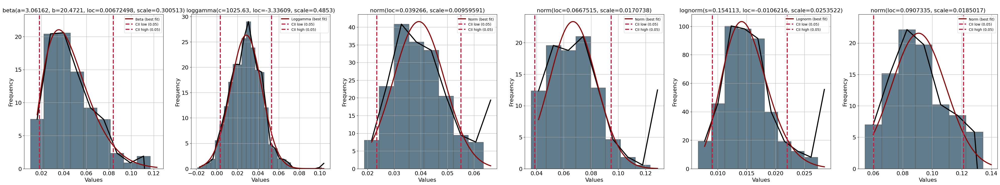

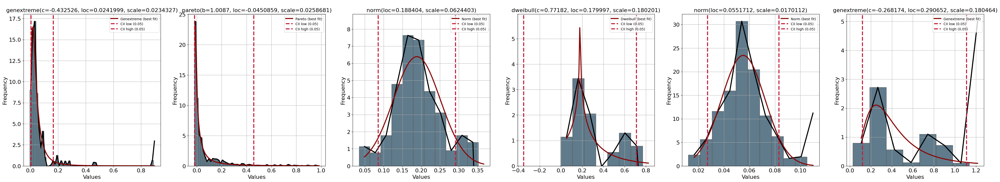

...

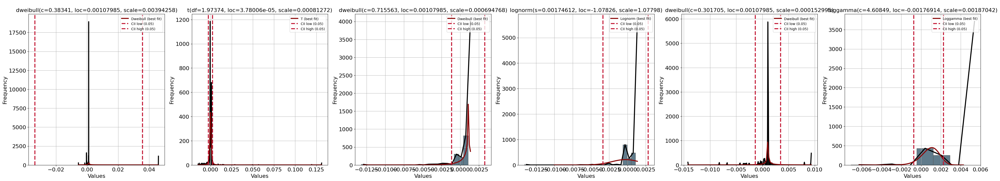

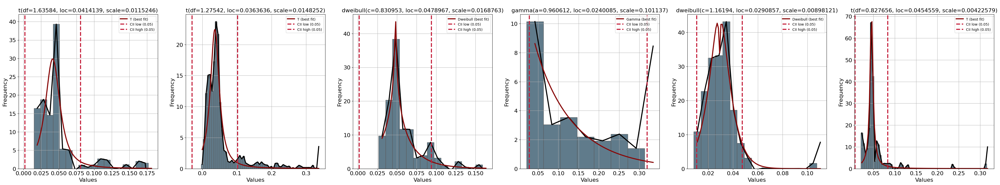

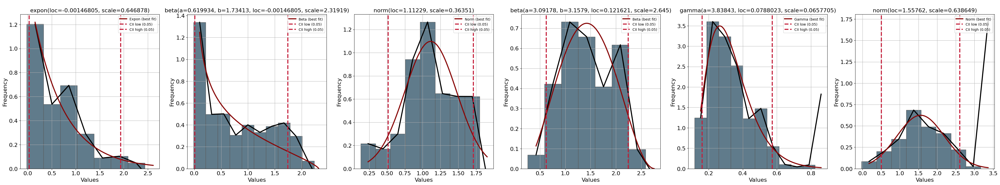

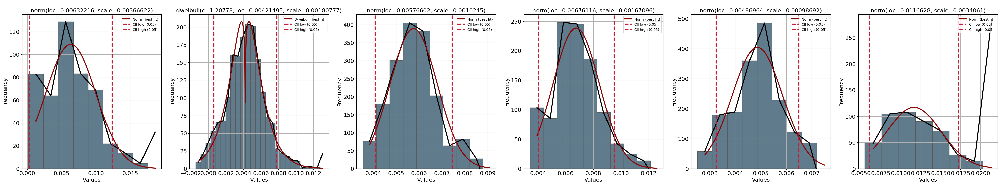

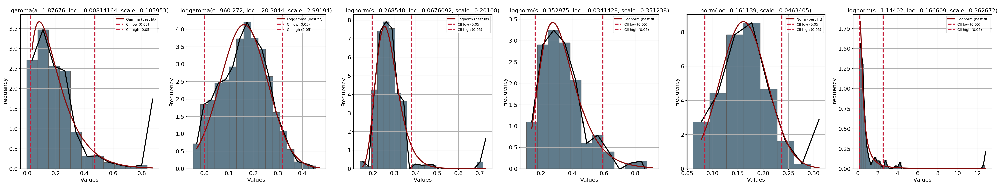

In [30]:
results = list()
for game in games:
    fig, ax = plt.subplots(1, 6, figsize=(50,8))
    ax_idx = 0
    for key in algo_bench.keys():
        data = np.array([i for i in algo_bench[key][game]], dtype=float)
        norm_data = score_normalization(data, RANDOM_SCORES[game], NORM_BASELINE[game])
        _, p_val = stats.normaltest(norm_data)
        if p_val > 0.05:
            dfit = distfit(distr='norm', alpha=0.05, smooth=1, verbose=0)
        else:
            # Search for best theoretical fit on your empirical data
            dfit = distfit(distr="popular", alpha=0.05, smooth= 1, verbose=0)
        results.append(dfit.fit_transform(norm_data))

        dfit.plot(ax=ax[ax_idx])
        ax[ax_idx].set_ylim(bottom=0)
        ax_idx +=1
    fig.savefig(f'Images/{game}.png', bbox_inches='tight')


In [31]:

# with open('results_each_algo.pkl', 'wb') as outp:
#     pickle.dump(results, outp)


# with open('results_each_algo_normal.pkl', 'wb') as outp: # First we test normality, then we fit --> There are more normal distributions!
#     pickle.dump(results, outp)


# with open('results_merged.pkl', 'wb') as outp:
#     pickle.dump(results_merged, outp)

# with open('results_merged_normal.pkl', 'wb') as outp:
#     pickle.dump(results_merged, outp)

# Most common distributions

In [34]:
# Computes the  number of times a certain distribution appears within the dataset.
with open('results_each_algo_normal.pkl', 'rb') as file:
    results = pickle.load(file)


distr_lst = [i['model']['name'] for i in results]
dt = dict(Counter(distr_lst))
ddt = dict()
for key, value in dt.items():
    ddt.update({key:value/len(distr_lst)*100})


In [35]:
ddt 

{'genextreme': 10.256410256410255,
 'dweibull': 12.179487179487179,
 'norm': 32.05128205128205,
 'beta': 8.974358974358974,
 't': 10.256410256410255,
 'lognorm': 10.256410256410255,
 'loggamma': 5.128205128205128,
 'pareto': 1.9230769230769231,
 'gamma': 8.333333333333332,
 'expon': 0.641025641025641}

# Generating a simulated dataset

In [4]:
with open('results_each_algo_normal.pkl', 'rb') as file:
    results = pickle.load(file)

with open('results_merged_normal.pkl', 'rb') as file:
    results_merged = pickle.load(file)


In [5]:
games = ['Alien', 'Amidar', 'Assault', 'Asterix', 'BankHeist', 'BattleZone', 'Boxing', 'Breakout', 'ChopperCommand', 'CrazyClimber', 'DemonAttack', 'Freeway', 'Frostbite', 'Gopher', 'Hero', 'Jamesbond', 'Kangaroo', 'Krull', 'KungFuMaster', 'MsPacman', 'Pong', 'PrivateEye', 'Qbert', 'RoadRunner', 'Seaquest', 'UpNDown']
distr_to_fun = {'t': stats.t, 'dweibull': stats.dweibull, 'expon': stats.expon, 'gamma': stats.gamma, 'genextreme': stats.genextreme, 'beta': stats.beta, 'pareto': stats.pareto, 'lognorm': stats.lognorm, 'loggamma': stats.loggamma}
results_merged_dict = dict(zip(games, results_merged))
algo_bench_distr = dict(zip(games, [distr_to_fun[res['model']['name']] for res in results_merged]))

KeyError: 'norm'

Preparing a dataset with specific types of distributions. Once I have defined the dataset I can modify it enforcing a different location parameter for example. 

In [7]:
nsamples= 10
df = nsamples-1
weibull_coeff = 2 # allows bi-modal curves.
gamma_coeff = 1.5
genextreme_coeff = 0
beta_A = 1
beta_B = 2
pareto_coeff = 1
lognorm_coeff = 0.5
loggamma_coeff = 1.5
LOC = 0
SCALE = 1
games = ['Alien', 'Amidar', 'Assault', 'Asterix', 'BankHeist', 'BattleZone', 'Boxing', 'Breakout', 'ChopperCommand', 'CrazyClimber', 'DemonAttack', 'Freeway', 'Frostbite', 'Gopher', 'Hero', 'Jamesbond', 'Kangaroo', 'Krull', 'KungFuMaster', 'MsPacman', 'Pong', 'PrivateEye', 'Qbert', 'RoadRunner', 'Seaquest', 'UpNDown']
distr_to_fun = {
    "norm": stats.norm(loc=LOC, scale=SCALE),
    "t": stats.t(df=df, loc = LOC, scale = SCALE),
    "dweibull": stats.dweibull(c= weibull_coeff, loc = LOC, scale = SCALE),
    "expon": stats.expon(loc = LOC, scale = SCALE),
    "gamma": stats.gamma(a= gamma_coeff, loc = LOC, scale = SCALE),
    "genextreme": stats.genextreme(c=genextreme_coeff, loc = LOC, scale = SCALE),
    "beta": stats.beta(a = beta_A, b = beta_B, loc = LOC, scale = SCALE),
    "pareto": stats.pareto(b = pareto_coeff, loc = LOC, scale = SCALE),
    "lognorm": stats.lognorm(s = lognorm_coeff, loc = LOC, scale = SCALE),
    "loggamma": stats.loggamma(c = loggamma_coeff, loc = LOC, scale = SCALE),
}
results_merged_dict = dict(zip(games, results_merged))
algo_bench_distr = dict(zip(games, [distr_to_fun[res['model']['name']] for res in results_merged]))
# for game in games:
#     print(algo_bench_distr[game].rvs(size = nsamples))

In [8]:

C = 10
STATSDISTRI = {
    "norm": stats.norm,
    "t": stats.t,
    "dweibull": stats.dweibull,
    "expon": stats.expon,
    "gamma": stats.gamma,
    "genextreme": stats.genextreme,
    "beta": stats.beta,
    "pareto": stats.pareto,
    "lognorm": stats.lognorm,
    "loggamma": stats.loggamma
}
PARAMETERS = {
    "norm":     {"loc": [LOC], "scale": [SCALE]},
    "t":        {"loc": [LOC], "scale": [SCALE], "df": [C]},
    "dweibull": {"loc": [LOC], "scale": [SCALE], "c": [1, 2, 3]},
    "expon":    {"loc": [LOC], "scale": [SCALE]},
    "gamma":    {"loc": [LOC], "scale": [SCALE], "a": [1.5]},
    "genextreme": {"loc": [LOC], "scale": [SCALE], "c": [0]},
    "beta":     {"loc": [LOC], "scale": [SCALE], "a": [1], "b": [2]},
    "pareto":   {"loc": [LOC], "scale": [SCALE], "b": [1]},
    "lognorm":  {"loc": [LOC], "scale": [SCALE], "s": [0.5]},
    "loggamma": {"loc": [LOC], "scale": [SCALE], "c": [1.5]}
    }

RMERDICT = dict(zip(games, [res['model']['name'] for res in results_merged]))
for game, distr_name in zip(games, [res['model']['name'] for res in results_merged]):
    distribution = STATSDISTRI[distr_name]
    for attribute in PARAMETERS[distr_name].keys():
        distribution.__setattr__(attribute, random.choice(PARAMETERS[distr_name][attribute]) )

def mergdistr_rvs(game:str = "Alien", loc: float = LOC, scale: float = SCALE, size: int = 10)-> int:
    PARAMETERS = {
    "norm":     {"loc": [loc], "scale": [scale]},
    "t":        {"loc": [loc], "scale": [scale], "df": [size]},
    "dweibull": {"loc": [loc], "scale": [scale], "c": [1, 2, 3]},
    "expon":    {"loc": [loc], "scale": [scale]},
    "gamma":    {"loc": [loc], "scale": [scale], "a": [1.5]},
    "genextreme": {"loc": [loc], "scale": [scale], "c": [0]},
    "beta":     {"loc": [loc], "scale": [scale], "a": [1], "b": [2]},
    "pareto":   {"loc": [loc], "scale": [scale], "b": [1]},
    "lognorm":  {"loc": [loc], "scale": [scale], "s": [0.5]},
    "loggamma": {"loc": [loc], "scale": [scale], "c": [1.5]}
    }
    distr_name = RMERDICT[game]
    arguments = dict()
    for attribute in PARAMETERS[distr_name].keys():
        attribute_value = random.choice(PARAMETERS[distr_name][attribute])
        arguments.update({attribute: attribute_value})
        # setattr(distribution, attribute, attribute_value)
        # print(distr_name,  attribute, attribute_value)
    
    distribution = STATSDISTRI[distr_name](**arguments)
    return distribution.rvs(size = size)

In [65]:
mergdistr_rvs("Seaquest", loc = 10, size=5)


array([11.03110512,  9.65248332, 10.95236464,  9.46038716, 10.66957669])

Il prossimo passaggio è fare il test di mack skillings. Ho però un problema. Non so calcolare, qui su Python, i valori critici. Per questo sto cercando di capire come ha fatto NSM3. 

In [7]:
# cMackSkil(0.05, 6, 26, 50)
cMackSkil(0.05, 2, 2, 100, method="Asymptotic")

{'stat.name': 'Mack-Skillings MS',
 'n.mc': 10000,
 'k': 2,
 'n': 2,
 'c': 100,
 'alpha': 0.05,
 'method': 'Asymptotic',
 'p_val': 3.841458820694124}

# False positive rate
Here we test what is the false positive rate when the sample is drawn from the same distribution.

In [22]:
df = nsamples-1
weibull_coeff = 2 # allows bi-modal curves.
gamma_coeff = 1.5
genextreme_coeff = 0
beta_A = 1
beta_B = 2
pareto_coeff = 1
lognorm_coeff = 0.5
loggamma_coeff = 1.5
LOC = 0
SCALE = 1
games = ['Alien', 'Amidar', 'Assault', 'Asterix', 'BankHeist', 'BattleZone', 'Boxing', 'Breakout', 'ChopperCommand', 'CrazyClimber', 'DemonAttack', 'Freeway', 'Frostbite', 'Gopher', 'Hero', 'Jamesbond', 'Kangaroo', 'Krull', 'KungFuMaster', 'MsPacman', 'Pong', 'PrivateEye', 'Qbert', 'RoadRunner', 'Seaquest', 'UpNDown']
distr_to_fun = {
    "norm": stats.norm(loc = LOC, scale = SCALE),
    "t": stats.t(df=df, loc = LOC, scale = SCALE),
    "dweibull": stats.dweibull(c= weibull_coeff, loc = LOC, scale = SCALE),
    "expon": stats.expon(loc = LOC, scale = SCALE),
    "gamma": stats.gamma(a= gamma_coeff, loc = LOC, scale = SCALE),
    "genextreme": stats.genextreme(c=genextreme_coeff, loc = LOC, scale = SCALE),
    "beta": stats.beta(a = beta_A, b = beta_B, loc = LOC, scale = SCALE),
    "pareto": stats.pareto(b = pareto_coeff, loc = LOC, scale = SCALE),
    "lognorm": stats.lognorm(s = lognorm_coeff, loc = LOC, scale = SCALE),
    "loggamma": stats.loggamma(c = loggamma_coeff, loc = LOC, scale = SCALE),
}
results_merged_dict = dict(zip(games, results_merged))
algo_bench_distr = dict(zip(games, [distr_to_fun[res['model']['name']] for res in results_merged]))

In [9]:
# Exactly the same distribution and the same sample
K = 2  # Number of treatments (i.e. number of algorithms)
N = 26  # Number of blocks (i.e. number of games)
C = 3 # number of datapoints for each treatment/block combination
num_obs = K * N * C
Nsim = 1000
MSv = np.zeros(Nsim)
Cs = list([1, 2, 3, 5, 10, 15, 20, 50])
Cs = list([10, 50])
fpos = np.zeros(len(Cs))
for g in range(len(Cs)):
    c = Cs[g]
    num_obs = K * N * c
    critical_value= cMackSkil(0.04, K, N, c, method="Asymptotic")['p_val']
    for f in range(Nsim):
        observ = np.zeros((N, K*C))
        for game, i in zip(games, range(N)):
            for j in range(K):
                if j == 0: # Reference treatment
                    ref_sample = mergdistr_rvs(game, size=C)
                    observ[i, j*C:j*C+C] = ref_sample
                else:
                    observ[i, j*C:j*C+C] = ref_sample

        ranks = stats.rankdata(observ, axis=1) # rank 1 corrisponde al valore piu' piccolo
        ranks = -np.add(ranks, -np.max(ranks+1)) # rank 1 adesso é il migliore

        avg_rank = np.zeros((N, K))
        for i in range(N):
            for j in range(K):
                avg_rank[i, j] = np.mean(ranks[i, j*C: j*C+C])

        S = np.mean(avg_rank, axis=0)*N
        MS = 12/(K*(num_obs+N))*np.sum(np.power(S,2)) -3*(num_obs+N)
        # print(f'Computed statistic: {MS} {"greater" if MS>critical_value else "smaller"} than critical value {critical_value}')
        MSv[f] = MS
    fpos[g] = np.sum(MSv>critical_value)/Nsim
    print(fpos)

[0. 0.]
[0. 0.]


In [10]:
# Same distribution but two different samples
K = 2  # Number of treatments (i.e. number of algorithms)
N = 26  # Number of blocks (i.e. number of games)
C = 3 # number of datapoints for each treatment/block combination
num_obs = K * N * C
Nsim = 1000
MSv = np.zeros(Nsim)
Cs = list([1, 2, 3, 5, 10, 15, 20, 50])
Cs = list([10, 50])
fpos = np.zeros(len(Cs))
for g in range(len(Cs)):
    c = Cs[g]
    num_obs = K * N * c
    critical_value= cMackSkil(0.04, K, N, c, method="Asymptotic")['p_val']
    for f in range(Nsim):
        observ = np.zeros((N, K*C))
        for game, i in zip(games, range(N)):
            for j in range(K):
                if j == 0: # Reference treatment
                    ref_sample = mergdistr_rvs(game, size=C)
                    observ[i, j*C:j*C+C] = ref_sample
                else: # Alternative treatment
                    altern_sample = mergdistr_rvs(game, size=C)
                    observ[i, j*C:j*C+C] = altern_sample

        ranks = stats.rankdata(observ, axis=1) # rank 1 corrisponde al valore piu' piccolo
        ranks = -np.add(ranks, -np.max(ranks+1)) # rank 1 adesso é il migliore

        avg_rank = np.zeros((N, K))
        for i in range(N):
            for j in range(K):
                avg_rank[i, j] = np.mean(ranks[i, j*C: j*C+C])

        S = np.mean(avg_rank, axis=0)*N
        MS = 12/(K*(num_obs+N))*np.sum(np.power(S,2)) -3*(num_obs+N)
        # print(f'Computed statistic: {MS} {"greater" if MS>critical_value else "smaller"} than critical value {critical_value}')
        MSv[f] = MS
    fpos[g] = np.sum(MSv>critical_value)/Nsim
    print(fpos)

[0. 0.]
[0. 0.]


# False positive rate with different scale parameter

In [12]:
df = nsamples-1
weibull_coeff = 2 # allows bi-modal curves.
gamma_coeff = 1.5
genextreme_coeff = 0
beta_A = 1
beta_B = 2
pareto_coeff = 1
lognorm_coeff = 0.5
loggamma_coeff = 1.5
LOC = 0
SCALE = 1
games = ['Alien', 'Amidar', 'Assault', 'Asterix', 'BankHeist', 'BattleZone', 'Boxing', 'Breakout', 'ChopperCommand', 'CrazyClimber', 'DemonAttack', 'Freeway', 'Frostbite', 'Gopher', 'Hero', 'Jamesbond', 'Kangaroo', 'Krull', 'KungFuMaster', 'MsPacman', 'Pong', 'PrivateEye', 'Qbert', 'RoadRunner', 'Seaquest', 'UpNDown']
distr_to_fun = {
    "t": stats.t(df=df, loc = LOC, scale = SCALE),
    "dweibull": stats.dweibull(c= weibull_coeff, loc = LOC, scale = SCALE),
    "expon": stats.expon(loc = LOC, scale = SCALE),
    "gamma": stats.gamma(a= gamma_coeff, loc = LOC, scale = SCALE),
    "genextreme": stats.genextreme(c=genextreme_coeff, loc = LOC, scale = SCALE),
    "beta": stats.beta(a = beta_A, b = beta_B, loc = LOC, scale = SCALE),
    "pareto": stats.pareto(b = pareto_coeff, loc = LOC, scale = SCALE),
    "lognorm": stats.lognorm(s = lognorm_coeff, loc = LOC, scale = SCALE),
    "loggamma": stats.loggamma(c = loggamma_coeff, loc = LOC, scale = SCALE),
}

SCALE = 2
distr_to_fun_scaled = {
    "t": stats.t(df=df, loc = LOC, scale = SCALE),
    "dweibull": stats.dweibull(c= weibull_coeff, loc = LOC, scale = SCALE),
    "expon": stats.expon(loc = LOC, scale = SCALE),
    "gamma": stats.gamma(a= gamma_coeff, loc = LOC, scale = SCALE),
    "genextreme": stats.genextreme(c=genextreme_coeff, loc = LOC, scale = SCALE),
    "beta": stats.beta(a = beta_A, b = beta_B, loc = LOC, scale = SCALE),
    "pareto": stats.pareto(b = pareto_coeff, loc = LOC, scale = SCALE),
    "lognorm": stats.lognorm(s = lognorm_coeff, loc = LOC, scale = SCALE),
    "loggamma": stats.loggamma(c = loggamma_coeff, loc = LOC, scale = SCALE),
}
results_merged_dict = dict(zip(games, results_merged))
algo_bench_distr = dict(zip(games, [distr_to_fun[res['model']['name']] for res in results_merged]))
algo_bench_distr_scaled = dict(zip(games, [distr_to_fun_scaled[res['model']['name']] for res in results_merged]))

Mean algo1=-0.07657049485211184, Mean algo2=-0.07657049485211177
Mean algo1=-0.030179680993700834, Mean algo2=-0.03017968099370088
Mean algo1=0.6047360164391167, Mean algo2=0.6047360164391165
Mean algo1=-0.03684827101371146, Mean algo2=-0.036848271013711485
Mean algo1=0.14163801759394137, Mean algo2=0.14163801759394137
Mean algo1=0.18761498875854865, Mean algo2=0.1876149887585486
Mean algo1=-0.02374642873977042, Mean algo2=-0.023746428739770432
Mean algo1=0.29982202841241407, Mean algo2=0.29982202841241407
Mean algo1=-0.007668166099506463, Mean algo2=-0.007668166099506442
Mean algo1=0.020940081207395392, Mean algo2=0.020940081207395295
Mean algo1=0.1550693347828972, Mean algo2=0.15506933478289725
Mean algo1=-0.03183875175888932, Mean algo2=-0.03183875175888938
Mean algo1=-0.1419609112385039, Mean algo2=-0.141960911238504
Mean algo1=-0.16853201898449632, Mean algo2=-0.1685320189844963
Mean algo1=0.3317395608067548, Mean algo2=0.3317395608067548
Mean algo1=0.14485696519291394, Mean algo2

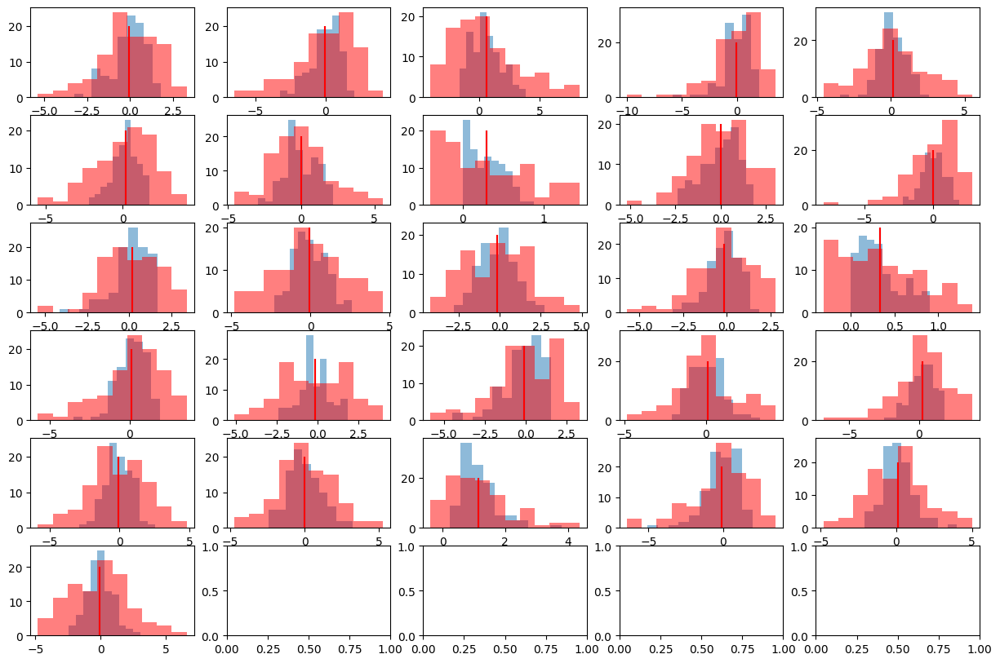

In [68]:
fig, ax = plt.subplots(6, 5, figsize=(15,10))
ax_idx = 0

for game in games:
    i, j = divmod(ax_idx, 5)
    ax_idx +=1
    data1 = mergdistr_rvs(game, scale=1, size=100)
    data2 = mergdistr_rvs(game, scale=2, size=100)
    data2 = data2 + (np.mean(data1) - np.mean(data2))
    ax[i, j].hist(data1, alpha=0.5)
    ax[i, j].vlines(np.mean(data1),0, 20)
    ax[i, j].hist(data2, color='red', alpha=0.5)
    ax[i, j].vlines(np.mean(data2),0, 20, color='red')

    print(f'Mean algo1={np.mean(data1)}, Mean algo2={np.mean(data2)}')


In [70]:
# Same type of distribution, same mean, different scales
K = 2  # Number of treatments (i.e. number of algorithms)
N = 26  # Number of blocks (i.e. number of games)
C = 3 # number of datapoints for each treatment/block combination
num_obs = K * N * C
Nsim = 1000
MSv = np.zeros(Nsim)
Cs = list([1, 2, 3, 5, 10, 15, 20, 50])
# Cs = list([10, 50])
fpos = np.zeros(len(Cs))
for g in range(len(Cs)):
    c = Cs[g]
    num_obs = K * N * c
    critical_value= cMackSkil(0.04, K, N, c, method="Asymptotic")['p_val']
    for f in range(Nsim):
        observ = np.zeros((N, K*C))
        for game, i in zip(games, range(N)):
            for j in range(K):
                if j == 0: # Reference hypothesis
                    ref_sample = mergdistr_rvs(game, scale=1, size=C)
                    # Hereafter we enforce the mean to be equal to zero. In this way we are sure that both samples have the same mean.
                    observ[i, j*C:j*C+C] = ref_sample - np.mean(ref_sample)
                else: # Alternative hypothesis
                    altern_sample = mergdistr_rvs(game, scale=2, size=C)
                    observ[i, j*C:j*C+C] = altern_sample - np.mean(altern_sample)

        ranks = stats.rankdata(observ, axis=1) # rank 1 corrisponde al valore piu' piccolo
        ranks = -np.add(ranks, -np.max(ranks+1)) # rank 1 adesso é il migliore

        avg_rank = np.zeros((N, K))
        for i in range(N):
            for j in range(K):
                avg_rank[i, j] = np.mean(ranks[i, j*C: j*C+C])

        S = np.mean(avg_rank, axis=0)*N
        MS = 12/(K*(num_obs+N))*np.sum(np.power(S,2)) -3*(num_obs+N)
        # print(f'Computed statistic: {MS} {"greater" if MS>critical_value else "smaller"} than critical value {critical_value}')
        MSv[f] = MS
    fpos[g] = np.sum(MSv>critical_value)/Nsim

print(fpos)

[0. 0. 0. 0. 0. 0. 0. 0.]


In [24]:
ref_sample

array([-1.48020528,  0.45461019,  0.42712018])

# Statistical Power

In [26]:
# Same type of distribution, mean , different scales
K = 2  # Number of treatments (i.e. number of algorithms)
N = 26  # Number of blocks (i.e. number of games)
C = 3 # number of datapoints for each treatment/block combination
num_obs = K * N * C
Nsim = 1000
MSv = np.zeros(Nsim)
Cs = list([1, 2, 3, 5, 10, 15, 20, 50])
r_eff = 0.2 # relative effect size.
# Cs = list([10, 50])
fpos = np.zeros(len(Cs))
for g in range(len(Cs)):
    c = Cs[g]
    num_obs = K * N * c
    critical_value= cMackSkil(0.04, K, N, c, method="Asymptotic")['p_val']
    for f in range(Nsim):
        observ = np.zeros((N, K*C))
        for game, i in zip(games, range(N)):
            for j in range(K):
                if j == 0: # Reference hypothesis
                    ref_sample = algo_bench_distr[game].rvs(size = C)
                    # Hereafter we enforce the mean to be equal to zero. In this way we are sure that both samples have the same mean.
                    observ[i, j*C:j*C+C] = algo_bench_distr[game].rvs(size = C) - np.mean(ref_sample)
                else: # Alternative hypothesis
                    altern_sample = algo_bench_distr_scaled[game].rvs(size = C)
                    observ[i, j*C:j*C+C] = altern_sample - np.mean(altern_sample) + r_eff*np.std(np.concatenate((ref_sample, altern_sample)))

        ranks = stats.rankdata(observ, axis=1) # rank 1 corrisponde al valore piu' piccolo
        ranks = -np.add(ranks, -np.max(ranks+1)) # rank 1 adesso é il migliore

        avg_rank = np.zeros((N, K))
        for i in range(N):
            for j in range(K):
                avg_rank[i, j] = np.mean(ranks[i, j*C: j*C+C])

        S = np.mean(avg_rank, axis=0)*N
        MS = 12/(K*(num_obs+N))*np.sum(np.power(S,2)) -3*(num_obs+N)
        # print(f'Computed statistic: {MS} {"greater" if MS>critical_value else "smaller"} than critical value {critical_value}')
        MSv[f] = MS
    fpos[g] = np.sum(MSv<critical_value)/Nsim # piu basso del valore critico allora rigetto l ipotesi nulla

print(fpos)

[0.902 0.898 0.909 0.898 0.91  0.911 0.91  0.916]


# False positive rate on normally distributed data
Inizio con un test su 2 policy e 5 task. Assumo la distribuzione normale.

In [5]:
STATSDISTRI = {
    "norm": stats.norm,
    "t": stats.t,
    "dweibull": stats.dweibull,
    "expon": stats.expon,
    "gamma": stats.gamma,
    "genextreme": stats.genextreme,
    "beta": stats.beta,
    "pareto": stats.pareto,
    "lognorm": stats.lognorm,
    "loggamma": stats.loggamma
}

def rvs_enforce(distr_name:str = "norm", mean :float = 0, var: float =1,  size: int = 10)-> int:
    loc = 0
    scale = 1

    PARAMETERS = {
    "norm":         {"loc": [loc], "scale": [scale]},
    "t":            {"loc": [loc], "scale": [scale], "df": [size]},
    "dweibull":     {"loc": [loc], "scale": [scale], "c": [1, 2, 3]},
    "expon":        {"loc": [loc], "scale": [scale]},
    "gamma":        {"loc": [loc], "scale": [scale], "a": [1.5]},
    "genextreme":   {"loc": [loc], "scale": [scale], "c": [0]},
    "beta":         {"loc": [loc], "scale": [scale], "a": [1], "b": [2]},
    "pareto":       {"loc": [loc], "scale": [scale], "b": [1]},
    "lognorm":      {"loc": [loc], "scale": [scale], "s": [0.5]},
    "loggamma":     {"loc": [loc], "scale": [scale], "c": [1.5]}
    }
    arguments = dict()
    for attribute in PARAMETERS[distr_name].keys():
        attribute_value = random.choice(PARAMETERS[distr_name][attribute])
        arguments.update({attribute: attribute_value})
        # setattr(distribution, attribute, attribute_value)
        # print(distr_name,  attribute, attribute_value)
    
    random_variable = STATSDISTRI[distr_name](**arguments)
    rv_mean = random_variable.mean()
    rv_var = random_variable.var()
    
    sample = (random_variable.rvs(size = size) - rv_mean)/rv_var*var + mean
        
    return sample


In [11]:
def run_simulation(nominal_alpha:float= 0.05, K:int = 2, N:int=5, Nsim:int=100, TASK_MEAN:list=list([[0, 0, 0, 0, 0], [0, 0, 0, 0, 0]]), TASK_VAR:list=list([[1, 1, 1, 1, 1], [1, 1, 1, 1, 1]]),  TASK_DISTR:list=list([["norm", "norm", "norm", "norm","norm"], ["norm", "norm", "norm", "norm","norm"]]) ):
    # K Number of treatments (i.e. number of algorithms)
    # N Number of blocks (i.e. number of games)
    # Nsim Number of simulation points for computing the effective alpha
    # task_mean list of means for each task. Assumes the two policies have the same distribution.
    # task_var list of variances for each task. Assumes the two policies have the same distribution.
    # task_distr list of distribution names for each task. Assumes the two policies have the same distribution.

    if np.shape(np.array(TASK_MEAN)) != (K, N):
        raise ValueError("Wrong shape length")

    if np.shape(np.array(TASK_MEAN)) != np.shape(np.array(TASK_VAR)) and np.shape(np.array(TASK_MEAN)) != np.shape(np.array(TASK_DISTR)):
        raise ValueError("The shape of TASK_MEAN, TASK_VAR and TASK_DISTR do not correspond")

    
    MSv = np.zeros(Nsim)
    p_vals_t = np.zeros(Nsim)
    p_vals_welch = np.zeros(Nsim)
    p_vals_welch_trim = np.zeros(Nsim)

    Cs = list([1, 2, 3, 5, 10, 15, 20, 50]) 

    fpos_MS = np.zeros(len(Cs))
    fpos_t = np.zeros(len(Cs))
    fpos_welch = np.zeros(len(Cs))
    fpos_welch_trim = np.zeros(len(Cs))

    for g in range(len(Cs)):
        C = Cs[g]           # number of datapoints for each treatment/block combination
        num_obs = K * N * C
        critical_value= cMackSkil(nominal_alpha, K, N, C, method="Asymptotic")['p_val']
        for f in range(Nsim): # Repeat the experiment Nsim times.
            observ = np.zeros((N, K*C))
            for i in range(N): # Loop over the number of tasks
                for j in range(K): # Loop over the different policies
                    task_mean = TASK_MEAN[j][i]
                    task_var = TASK_VAR[j][i]
                    task_distr = TASK_DISTR[j][i]
                    match j:
                        case 0: # Reference treatment
                            ref_sample = rvs_enforce(distr_name=task_distr, mean=task_mean, var=task_var, size=C)
                            observ[i, j*C:j*C+C] = ref_sample
                        case 1: # Alternative treatment
                            altern_sample = rvs_enforce(distr_name=task_distr, mean=task_mean, var= task_var, size=C)
                            observ[i, j*C:j*C+C] = altern_sample

            # Compute the Mack-Skillings test
            ranks = stats.rankdata(observ, axis=1) # rank 1 corrisponde al valore piu' piccolo
            ranks = -np.add(ranks, -np.max(ranks+1)) # rank 1 adesso é il migliore
            avg_rank = np.zeros((N, K))
            for i in range(N):
                for j in range(K):
                    avg_rank[i, j] = np.mean(ranks[i, j*C: j*C+C])
            S = np.mean(avg_rank, axis=0)*N
            MS = 12/(K*(num_obs+N))*np.sum(np.power(S,2)) -3*(num_obs+N)
            # print(f'Computed statistic: {MS} {"greater" if MS>critical_value else "smaller"} than critical value {critical_value}')
            MSv[f] = MS

            # Compute 2-sample tests (t, welch yuen). Assuming we merge all the data from the different tasks together
            sample1 = np.reshape(observ[:, 0:C], -1)
            sample2 = np.reshape(observ[:, C:2*C], -1)
            _, p_vals_t[f] = stats.ttest_ind(sample1, sample2, equal_var=True, alternative='two-sided', trim=0)
            _, p_vals_welch[f] = stats.ttest_ind(sample1, sample2, equal_var=False, alternative='two-sided', trim=0)
            _, p_vals_welch_trim[f] = stats.ttest_ind(sample1, sample2, equal_var=False, alternative='two-sided', trim=0.1)

        fpos_MS[g] = np.sum(MSv>critical_value)/Nsim
        fpos_t[g] = np.sum(p_vals_t<nominal_alpha)/Nsim
        fpos_welch[g] = np.sum(p_vals_welch<nominal_alpha)/Nsim
        fpos_welch_trim[g] = np.sum(p_vals_welch_trim<nominal_alpha)/Nsim
        
    return fpos_MS, fpos_t, fpos_welch, fpos_welch_trim
Cs = list([1, 2, 3, 5, 10, 15, 20, 50]) 


Text(0, 0.5, 'true alpha')

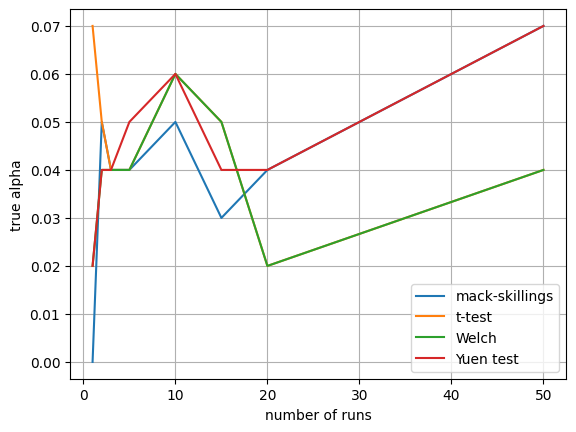

In [13]:
# Two policies and 5 tasks. We start with the most simple case, where all distributions are normal and have same mean and variance.

# fpos_MS, fpos_t, fpos_welch, fpos_welch_trim = run_simulation(nominal_alpha=0.05)
fpos_MS, fpos_t, fpos_welch, fpos_welch_trim = run_simulation(nominal_alpha=0.05, N=2, TASK_MEAN=list([[0, 0], [0, 0]]), TASK_VAR=list([[1, 1], [1, 1]]),  TASK_DISTR=list([["norm", "norm"], ["norm", "norm"]]))
# fpos_MS, fpos_t, fpos_welch, fpos_welch_trim = run_simulation(nominal_alpha=0.05, N=1, TASK_MEAN=list([[0], [0]]), TASK_VAR=list([[1], [1]]),  TASK_DISTR=list([["norm"], ["norm"]]))


fig, ax = plt.subplots()
ax.plot(Cs, fpos_MS, label='mack-skillings')
ax.plot(Cs, fpos_t, label='t-test')
ax.plot(Cs, fpos_welch, label='Welch')
ax.plot(Cs, fpos_welch_trim, label='Yuen test')
ax.legend()
ax.grid()
ax.set_xlabel('number of runs')
ax.set_ylabel('true alpha')

Text(0, 0.5, 'true alpha')

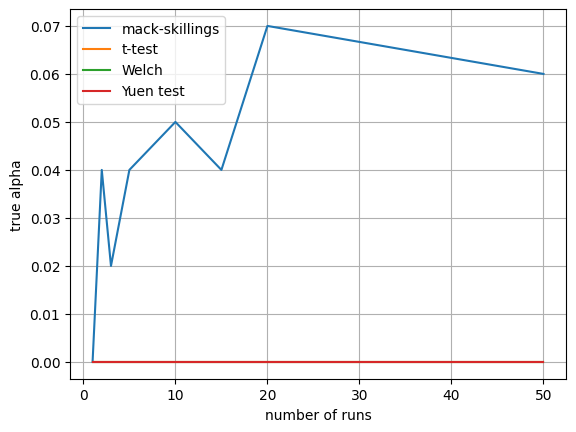

In [14]:
# Two policies and 5 tasks. All distributions have normal distribution but different tasks have different means

# fpos_MS, fpos_t, fpos_welch, fpos_welch_trim = run_simulation(nominal_alpha=0.05, TASK_MEAN=list([[0, -1, 0.001, 10, 100], [0, -1, 0.001, 10, 100]]))
fpos_MS, fpos_t, fpos_welch, fpos_welch_trim = run_simulation(nominal_alpha=0.05, N=2, TASK_MEAN=list([[0.001, 10], [0.001, 10]]), TASK_VAR=list([[1, 1], [1, 1]]),  TASK_DISTR=list([["norm", "norm"], ["norm", "norm"]]))


fig, ax = plt.subplots()
ax.plot(Cs, fpos_MS, label='mack-skillings')
ax.plot(Cs, fpos_t, label='t-test')
ax.plot(Cs, fpos_welch, label='Welch')
ax.plot(Cs, fpos_welch_trim, label='Yuen test')
ax.legend()
ax.grid()
ax.set_xlabel('number of runs')
ax.set_ylabel('true alpha')


Text(0, 0.5, 'true alpha')

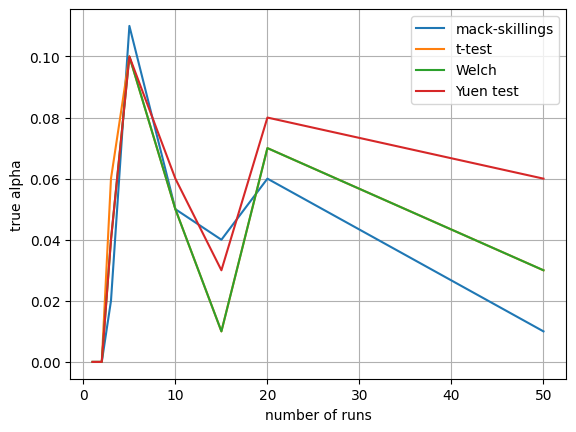

In [15]:
# Two policies and 5 tasks. Tasks of the two reference policies have the same mean and variance but are not normal distribution.

# fpos_MS, fpos_t, fpos_welch, fpos_welch_trim = run_simulation(nominal_alpha=0.05, TASK_DISTR = list([["norm", "norm", "loggamma", "t", "beta"], ["norm", "norm", "loggamma", "t", "beta"]]))
fpos_MS, fpos_t, fpos_welch, fpos_welch_trim = run_simulation(nominal_alpha=0.05, N=2, TASK_MEAN=list([[0, 0], [0, 0]]), TASK_VAR=list([[1, 1], [1, 1]]),  TASK_DISTR=list([["loggamma", "t"], ["loggamma", "t"]]))


fig, ax = plt.subplots()
ax.plot(Cs, fpos_MS, label='mack-skillings')
ax.plot(Cs, fpos_t, label='t-test')
ax.plot(Cs, fpos_welch, label='Welch')
ax.plot(Cs, fpos_welch_trim, label='Yuen test')
ax.legend()
ax.grid()
ax.set_xlabel('number of runs')
ax.set_ylabel('true alpha')

Text(0, 0.5, 'true alpha')

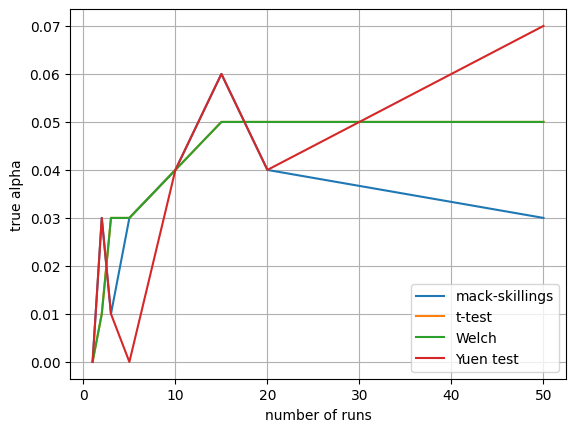

In [16]:
# Changing distribution between two policies
fpos_MS, fpos_t, fpos_welch, fpos_welch_trim = run_simulation(nominal_alpha=0.05, TASK_DISTR = list([["norm", "norm", "loggamma", "t", "beta"], ["gamma", "loggamma", "dweibull", "t", "beta"]]))
# fpos_MS, fpos_t, fpos_welch, fpos_welch_trim = run_simulation(nominal_alpha=0.05, N=2, TASK_MEAN=list([[0, 0], [0, 0]]), TASK_VAR=list([[1, 1], [1, 1]]),  TASK_DISTR=list([["loggamma", "t"], ["t", "beta"]]))


fig, ax = plt.subplots()
ax.plot(Cs, fpos_MS, label='mack-skillings')
ax.plot(Cs, fpos_t, label='t-test')
ax.plot(Cs, fpos_welch, label='Welch')
ax.plot(Cs, fpos_welch_trim, label='Yuen test')
ax.legend()
ax.grid()
ax.set_xlabel('number of runs')
ax.set_ylabel('true alpha')

Text(0, 0.5, 'true alpha')

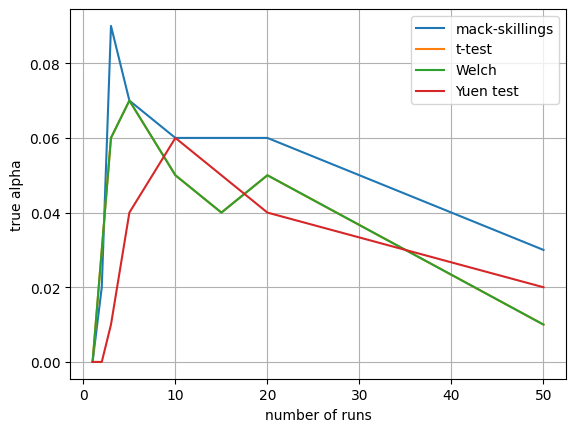

In [17]:
# Tasks of the two reference policies have the distribution and same mean. Distributions are not normal and the variances change from task to task.

fpos_MS, fpos_t, fpos_welch, fpos_welch_trim = run_simulation(nominal_alpha=0.05, TASK_VAR=list([[1, 2, 10, 0.1, 8], [1, 2, 10, 0.1, 8]]), TASK_DISTR = list([["norm", "norm", "loggamma", "t", "beta"], ["norm", "norm", "loggamma", "t", "beta"]]))
# fpos_MS, fpos_t, fpos_welch, fpos_welch_trim = run_simulation(nominal_alpha=0.05, N=2, TASK_MEAN=list([[0, 0], [0, 0]]), TASK_VAR=list([[1, 1], [1, 1]]),  TASK_DISTR=list([["loggamma", "t"], ["loggamma", "t"]]))


fig, ax = plt.subplots()
ax.plot(Cs, fpos_MS, label='mack-skillings')
ax.plot(Cs, fpos_t, label='t-test')
ax.plot(Cs, fpos_welch, label='Welch')
ax.plot(Cs, fpos_welch_trim, label='Yuen test')
ax.legend()
ax.grid()
ax.set_xlabel('number of runs')
ax.set_ylabel('true alpha')

Text(0, 0.5, 'true alpha')

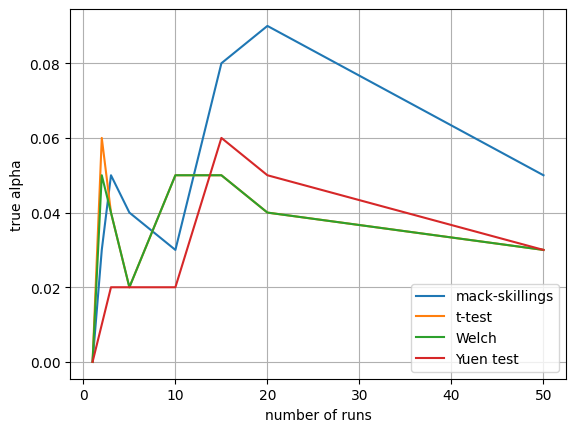

In [18]:
# Tasks of the two reference policies have the distribution type and same mean. Distributions are not normal and the variances change from task to task and also within the same task from one policy to the other.

fpos_MS, fpos_t, fpos_welch, fpos_welch_trim = run_simulation(nominal_alpha=0.05, TASK_VAR=list([[1, 2, 10, 0.1, 8], [1, 4, 12, 0.5, 6]]), TASK_DISTR = list([["norm", "norm", "loggamma", "t", "beta"], ["norm", "norm", "loggamma", "t", "beta"]]))
# fpos_MS, fpos_t, fpos_welch, fpos_welch_trim = run_simulation(nominal_alpha=0.05, N=2, TASK_MEAN=list([[0, 0], [0, 0]]), TASK_VAR=list([[1, 1], [1, 1]]),  TASK_DISTR=list([["loggamma", "t"], ["loggamma", "t"]]))


fig, ax = plt.subplots()
ax.plot(Cs, fpos_MS, label='mack-skillings')
ax.plot(Cs, fpos_t, label='t-test')
ax.plot(Cs, fpos_welch, label='Welch')
ax.plot(Cs, fpos_welch_trim, label='Yuen test')
ax.legend()
ax.grid()
ax.set_xlabel('number of runs')
ax.set_ylabel('true alpha')

Text(0, 0.5, 'true alpha')

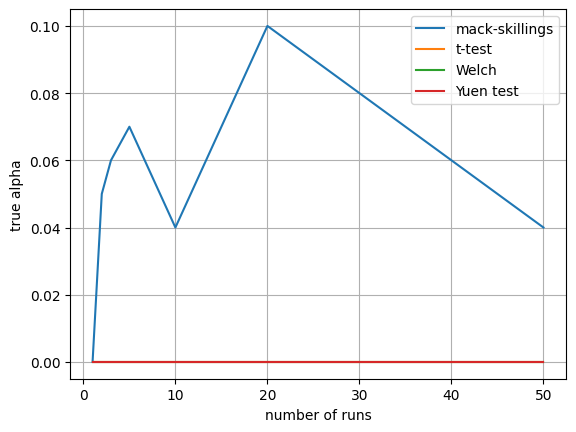

In [19]:
# Tasks of the two reference policies have the distribution type and same mean. Distributions are not normal and the variances change from task to task and also within the same task from one policy to the other.

fpos_MS, fpos_t, fpos_welch, fpos_welch_trim = run_simulation(nominal_alpha=0.05,  TASK_MEAN=list([[0, -1, 0.001, 10, 100], [0, -1, 0.001, 10, 100]]), TASK_VAR=list([[1, 2, 10, 0.1, 8], [1, 4, 12, 0.5, 6]]), TASK_DISTR = list([["norm", "norm", "loggamma", "t", "beta"], ["norm", "norm", "loggamma", "t", "beta"]]))
# fpos_MS, fpos_t, fpos_welch, fpos_welch_trim = run_simulation(nominal_alpha=0.05, N=2, TASK_MEAN=list([[0, 0], [0, 0]]), TASK_VAR=list([[1, 1], [1, 1]]),  TASK_DISTR=list([["loggamma", "t"], ["loggamma", "t"]]))


fig, ax = plt.subplots()
ax.plot(Cs, fpos_MS, label='mack-skillings')
ax.plot(Cs, fpos_t, label='t-test')
ax.plot(Cs, fpos_welch, label='Welch')
ax.plot(Cs, fpos_welch_trim, label='Yuen test')
ax.legend()
ax.grid()
ax.set_xlabel('number of runs')
ax.set_ylabel('true alpha')